In [12]:
from PIL import Image
import torch
from pypylon import pylon
import numpy as np
import cv2
from ctypes import *
import glob
import matplotlib.pylab as pl
import matplotlib.pyplot as plt
import time
import imquality.brisque as brisque
%matplotlib inline

In [127]:
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', force_reload=True, pretrained=True)

Downloading: "https://github.com/ultralytics/yolov5/archive/master.zip" to C:\Users\CIG/.cache\torch\hub\master.zip

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Focus                     [3, 32, 3]                    
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     18816  models.common.C3                        [64, 64, 1]                   
  3                -1  1     73984  models.common.Conv                      [64, 128, 3, 2]               
  4                -1  1    156928  models.common.C3                        [128, 128, 3]                 
  5                -1  1    295424  models.common.Conv                      [128, 256, 3, 2]              
  6                -1  1    625152  models.common.C3                        [256, 256, 3]                 
  7                -1  1   

Adding autoShape... 


In [126]:
def find_class(results, obj = 'car'):
    len_of_class = len(results.pred)
    pred_class = [int(results.pred[0][i].numpy()[5]) for i in range(len(results.pred[0]))]
    #list_of_yolo_classes = list(zip(results.names, range(0, len(results.names))))
    pred_names = [results.names[i] for i in pred_class]
    if obj in pred_names:
        index = pred_names.index(obj)
        return results.pred[0][index].numpy()
    else:
        return np.array([])
    
# def yolo_information(model_yolo, stack_of_imgs):
#     imgs_stack_yolo = []
#     for im in stack_of_imgs:
#         results = model_yolo(im, size=640)  
#         results.print()  # print results to screen
#         #results.show()  # display results
#         r = find_class(results, obj = 'car')
#         if r.size == 0:
#             imgs_stack_yolo.append(0)
#         else:
#             imgs_stack_yolo.append(im.crop((r[0], r[1], r[2], r[3])))
            
#     return imgs_stack_yolo

In [8]:
img_path = r'D:\cringe'

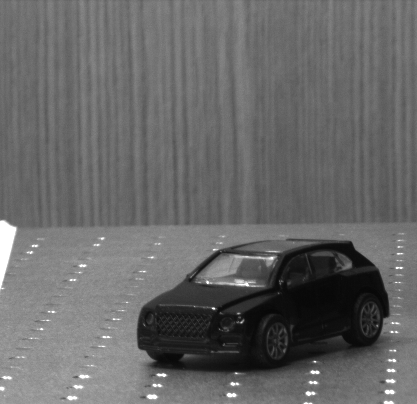

In [9]:
Image.open(r'D:\cringe\20\img_48.17.png')

C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


25.371034454660702


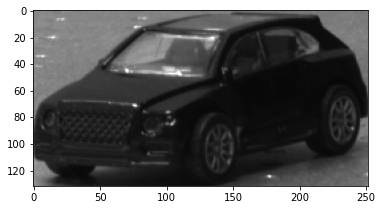

In [13]:
#48.17
image_infocus = np.load(r'D:\cringe\20\img_48.17.npy')
prediction_yolo = model_yolo(image_infocus)
car_infocus_xy = find_class(prediction_yolo)
car_infocus = Image.fromarray(image_infocus).crop((car_infocus_xy[0], 
                                                   car_infocus_xy[1], 
                                                   car_infocus_xy[2],
                                                   car_infocus_xy[3]))
plt.imshow(car_infocus)
print(brisque.score(car_infocus))

C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


42.29951973898753


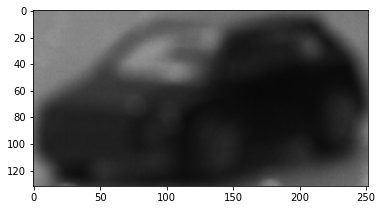

In [14]:
#46.54
image_outfocus = np.load(r'D:\cringe\20\img_46.54.npy')
prediction_yolo = model_yolo(image_outfocus)
car_outfocus_xy = find_class(prediction_yolo)
car_outfocus = Image.fromarray(image_outfocus).crop((car_infocus_xy[0], 
                                                   car_infocus_xy[1], 
                                                   car_infocus_xy[2],
                                                   car_infocus_xy[3]))
plt.imshow(car_outfocus)
print(brisque.score(car_outfocus))

In [128]:
def stack_images_array(path):
    images=glob.glob(path + "\*.png")
    stack_of_imgs = []
    i = 0
    name = []
    for image in images:
        if i%98 == 0:
            name.append(image)
            img = Image.open(image)
            stack_of_imgs.append(img)
        i+=1
    return stack_of_imgs, name

def yolo_information(model_yolo, stack_of_imgs):
    imgs_stack_yolo = []
    for im in stack_of_imgs:
        results = model_yolo(im, size=640)  
        results.print()  # print results to screen
        #results.show()  # display results
        r = find_class(results, obj = 'car')
        if r.size == 0:
            imgs_stack_yolo.append(0)
        else:
            imgs_stack_yolo.append(im.crop((r[0], r[1], r[2], r[3])))
            
    return imgs_stack_yolo


def yolo_focus_value(imgs_stack_yolo):
    # Define containers
    average_gradient = []

    for im in imgs_stack_yolo:
        if im == 0:
            average_gradient.append(0)
        else:
            # Calculate the gradient
            sobelx = cv2.Sobel(np.float32(im), cv2.CV_64F ,1 , 0, ksize=5)
            sobely = cv2.Sobel(np.float32(im),cv2.CV_64F,0,1,ksize=5)

            abs_sobel_x = cv2.convertScaleAbs(sobelx) # converting back to uint8
            abs_sobel_y = cv2.convertScaleAbs(sobely)
            #print(abs_sobel_x )

            # Combine the two gradients with equal weight
            dst = cv2.addWeighted(abs_sobel_x,0.5,abs_sobel_y,0.5,0)
            #print(dst)

            # Calculate the average gradient for the image
            # I convert it to a numpy array for ease of calculation
            average_gradient.append(pl.asarray(dst).mean())
    return average_gradient

In [73]:
stack_of_imgs_20, name_20 = stack_images_array(r'D:\cringe\20')
yolo_20 = yolo_information(model_yolo, stack_of_imgs_20)

image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417 1 car
image 1/1: 404x417 1 car
image 1/1: 404x417 1 car
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417
image 1/1: 404x417


In [53]:
yolo_20 = yolo_focus_value(yolo_20)

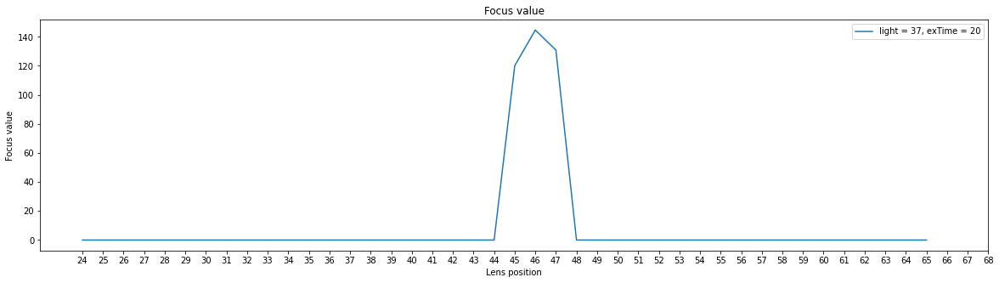

In [63]:
plt.figure(figsize=(20,5))
plt.plot(np.arange(24,66,1), yolo_20, label = 'light = 37, exTime = 20')
plt.title("Focus value")
plt.xlabel('Lens position')
plt.ylabel('Focus value')
plt.legend()
plt.xticks(np.arange(24, 69, step=1))
plt.savefig('focus_value.png', bbox_inches = 'tight',
    pad_inches = 0)
plt.show()

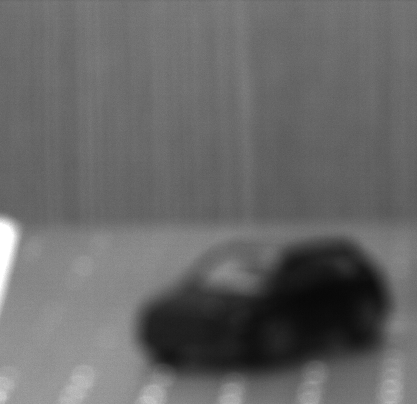

In [56]:
stack_of_imgs_20[20]

In [74]:
name_20[20]

'D:\\cringe\\20\\img_45.79.png'

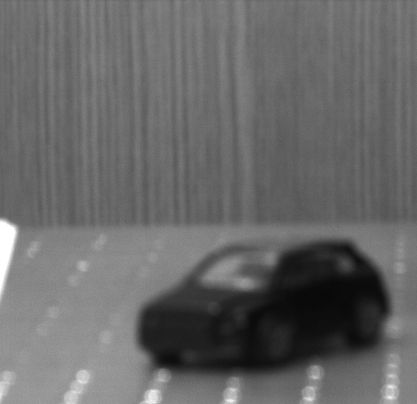

In [57]:
stack_of_imgs_20[21]

In [75]:
name_20[21]

'D:\\cringe\\20\\img_46.87.png'

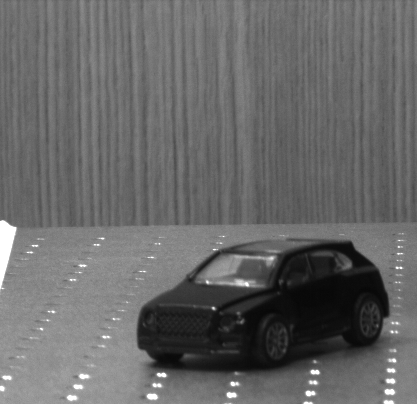

In [58]:
stack_of_imgs_20[22]

In [76]:
name_20[22]

'D:\\cringe\\20\\img_47.95.png'

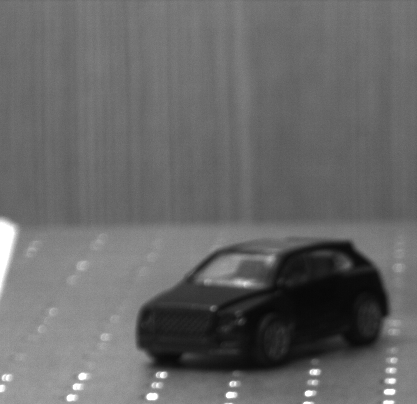

In [59]:
stack_of_imgs_20[23]

In [77]:
name_20[23]

'D:\\cringe\\20\\img_49.13.png'

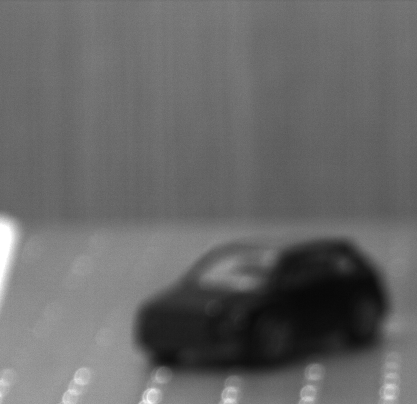

In [60]:
stack_of_imgs_20[24]

In [78]:
name_20[24]

'D:\\cringe\\20\\img_50.21.png'

# EfficientNet

In [79]:
from efficientnet_pytorch import EfficientNet
model = EfficientNet.from_pretrained('efficientnet-b0')

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to C:\Users\CIG/.cache\torch\hub\checkpoints\efficientnet-b0-355c32eb.pth



Loaded pretrained weights for efficientnet-b0


In [137]:
import json
from PIL import Image
import torch
from torchvision import transforms

# Preprocess image
tfms = transforms.Compose([transforms.Resize(224), transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),])
img = tfms(Image.open(r'D:\cringe\20\img_48.17.png')).unsqueeze(0)
print(img.shape) # torch.Size([1, 3, 224, 224])

# Load ImageNet class names
labels_map = json.load(open('labels_map.txt'))
labels_map = [labels_map[str(i)] for i in range(1000)]

# Classify
model.eval()
with torch.no_grad():
    outputs = model(img)

# Print predictions
print('-----')
for idx in torch.topk(outputs, k=5).indices.squeeze(0).tolist():
    prob = torch.softmax(outputs, dim=1)[0, idx].item()
    print(prob)
    print('{label:<75} ({p:.2f}%)'.format(label=labels_map[idx], p=prob*100))

torch.Size([1, 3, 224, 231])
-----
0.3022892475128174
racer, race car, racing car                                                 (30.23%)
0.13516464829444885
sports car, sport car                                                       (13.52%)
0.03927033022046089
convertible                                                                 (3.93%)
0.029165329411625862
lawn mower, mower                                                           (2.92%)
0.028406940400600433
beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon (2.84%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


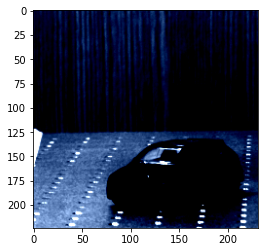

In [138]:
img_new = np.squeeze(img.numpy()).transpose((1, 2, 0))
plt.imshow(img_new)


In [139]:
print(brisque.score(img_new))

C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


29.78407249471215


In [133]:
img = tfms(Image.open(r'D:\\cringe\\20\\img_49.13.png')).unsqueeze(0)
print(img.shape) # torch.Size([1, 3, 224, 224])

# Load ImageNet class names
labels_map = json.load(open('labels_map.txt'))
labels_map = [labels_map[str(i)] for i in range(1000)]

# Classify
model.eval()
with torch.no_grad():
    outputs = model(img)

# Print predictions
print('-----')
for idx in torch.topk(outputs, k=5).indices.squeeze(0).tolist():
    prob = torch.softmax(outputs, dim=1)[0, idx].item()
    print(prob)
    print('{label:<75} ({p:.2f}%)'.format(label=labels_map[idx], p=prob*100))

torch.Size([1, 3, 224, 231])
-----
0.04144808650016785
racer, race car, racing car                                                 (4.14%)
0.028797246515750885
parking meter                                                               (2.88%)
0.025478405877947807
mousetrap                                                                   (2.55%)
0.020504964515566826
cab, hack, taxi, taxicab                                                    (2.05%)
0.015268751420080662
vacuum, vacuum cleaner                                                      (1.53%)


In [134]:
# import torchvision
# to_pil = torchvision.transforms.ToPILImage()
# img = to_pil(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


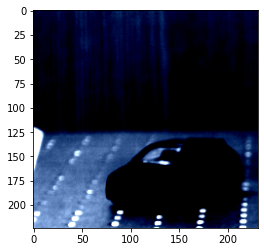

In [135]:
img_new = np.squeeze(img.numpy()).transpose((1, 2, 0))
plt.imshow(img_new)

In [136]:
print(brisque.score(img_new))

C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


22.674936596620427


# RetinaNet

In [21]:
import torch
import torchvision
import cv2
import torchvision.transforms as transforms
import numpy as np
from PIL import Image


In [34]:
coco_names = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
# this will help us create a different color for each class
COLORS = np.random.uniform(0, 255, size=(len(coco_names), 3))

In [22]:
model = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)
model.eval()

RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256)
          )
        )
        (1): Bottleneck

In [60]:
# define the torchvision image transforms
transform = transforms.Compose([
    transforms.ToTensor(),])
#https://debuggercafe.com/object-detection-using-retinanet-with-pytorch-and-deep-learning/
def predict (image, model, detection_threshold =0.6, device ='cpu',):
    # transform the image to tensor
    image = transform(image).to(device)
    image = image.unsqueeze(0) # add a batch dimension
    with torch.no_grad():
        outputs = model(image) # get the predictions on the image
    # get all the scores
    scores = list(outputs[0]['scores'].detach().cpu().numpy())
    # index of those scores which are above a certain threshold
    thresholded_preds_inidices = [scores.index(i) for i in scores if i > detection_threshold]
    # get all the predicted bounding boxes
    bboxes = outputs[0]['boxes'].detach().cpu().numpy()
    # get boxes above the threshold score
    boxes = bboxes[np.array(scores) >= detection_threshold].astype(np.int32)
    # get all the predicited class names
    labels = outputs[0]['labels'].cpu().numpy()
    pred_classes = [coco_names[labels[i]] for i in thresholded_preds_inidices]
    return boxes, pred_classes, scores

def draw_boxes (boxes, classes, image):
    for i, box in enumerate(boxes):
        color = COLORS[coco_names.index(classes[i])]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[1]-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2, 
                    lineType=cv2.LINE_AA)
    return image

In [61]:
image = Image.open(r'D:\cringe\20\img_48.17.png').convert('RGB')
# a NumPy copy for OpenCV functions
image_array = np.array(image)
# convert to OpenCV BGR color format
image_array = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

In [62]:
# get the bounding boxes and class labels
boxes, classes, scores = predict(image, model)
# get the final image
result = draw_boxes(boxes, classes, image_array)

In [63]:
boxes, classes

(array([[135, 233, 389, 366]]), ['car'])

In [64]:
scores

[0.0639584,
 0.05656022,
 0.91941607,
 0.08910703,
 0.061932784,
 0.10613946,
 0.057240605,
 0.07683759,
 0.057995472,
 0.09124999,
 0.081856295,
 0.054290835,
 0.0517945,
 0.06843451,
 0.053679787]

In [65]:
new = image.crop((int(boxes[0][0]), int(boxes[0][1]),int(boxes[0][2]), int(boxes[0][3])))

In [68]:
print(brisque.score(new))

24.55404490424391


C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


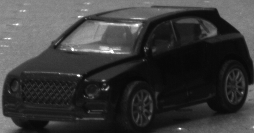

In [69]:
new

# Threshold

In [70]:
path_tid = r'D:\tid'

In [72]:
reference_image_path = r'D:\tid\reference_images\I15.bmp'

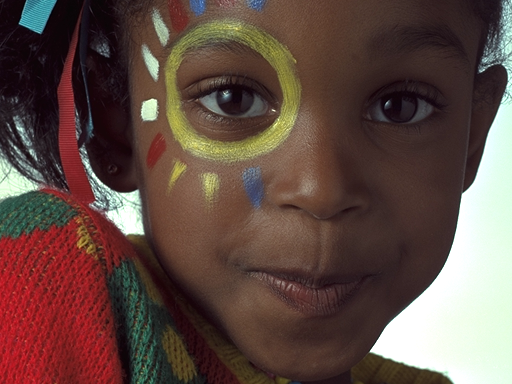

In [77]:
Image.open(reference_image_path )

In [79]:
print(brisque.score(Image.open(reference_image_path ).convert('RGB')))

C:\Users\CIG\Anaconda3\envs\corning\lib\site-packages\imquality\brisque.py:45: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  self.image = skimage.color.rgb2gray(self.image)


-9.453451405625998


In [83]:
import warnings
warnings.filterwarnings("ignore")
images=glob.glob(r'D:\tid\tid_girl' + "\*.bmp")
i = 0
img_stack = []
for image in images:
    print(i, brisque.score(Image.open(image)))
    img_stack.append(Image.open(image))
    i+=1
    if i%15 == 0:
        break

0 32.04171450772682
1 44.71726046136072
2 53.169364796180815
3 60.001290278722735
4 -0.8855971630503348
5 20.184835141431535
6 31.131874745687327
7 42.719879797388074
8 8.830522463472647
9 11.24197421734138
10 13.375071117015949
11 13.959254838721876
12 12.846164015311018
13 -8.885344109052568
14 -3.482077961740316


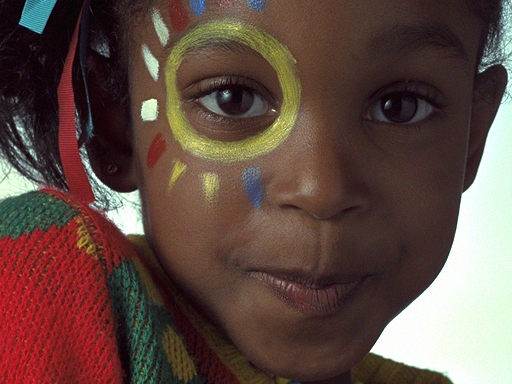

In [84]:
img_stack[4]
#-0.88

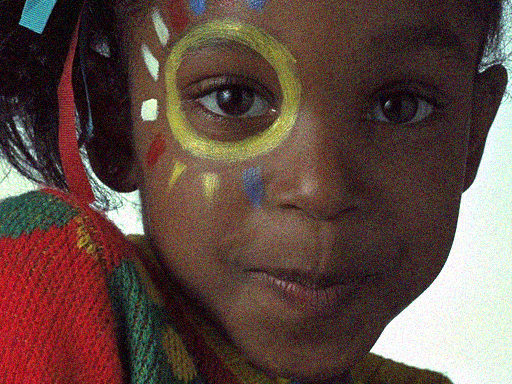

In [89]:
img_stack[2]
#53

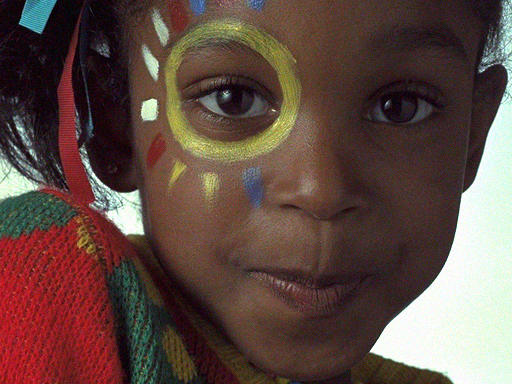

In [85]:
img_stack[5]
#20.18

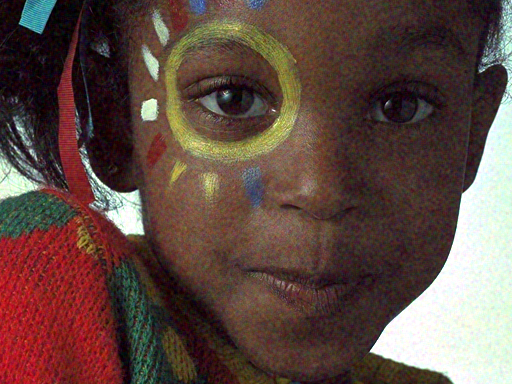

In [86]:
img_stack[9]
#10

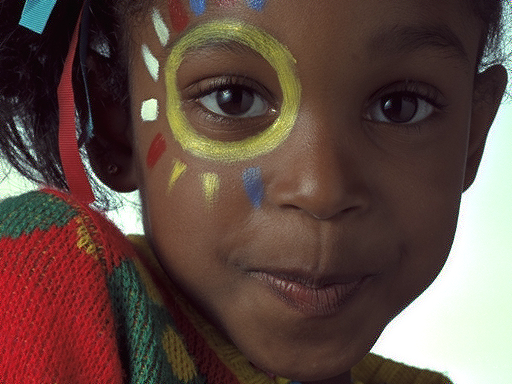

In [87]:
img_stack[13]
#-3

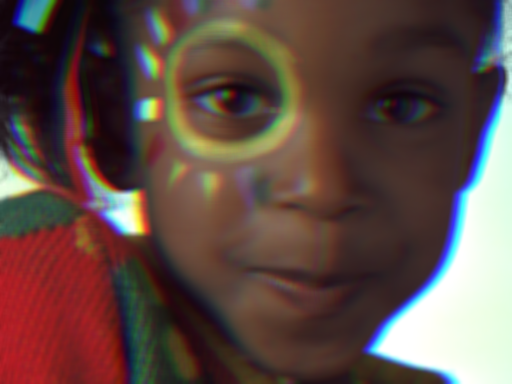

In [92]:
Image.open(r'D:\tid\tid_girl\i15_23_5.bmp')

In [91]:
brisque.score(Image.open(r'D:\tid\tid_girl\i15_23_5.bmp'))

74.10886768457337

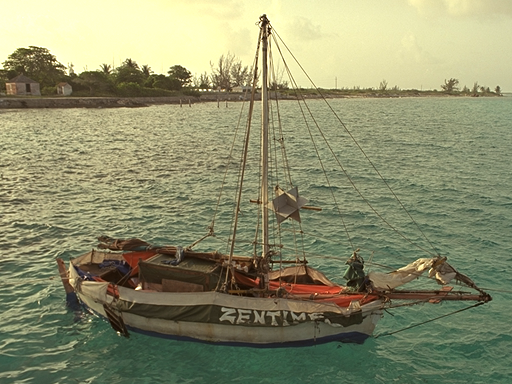

In [94]:
Image.open(r'D:\tid\reference_images\I06.bmp' )

In [96]:
brisque.score(Image.open(r'D:\tid\reference_images\I06.bmp' ))

1.4545071940897003

In [95]:
import warnings
warnings.filterwarnings("ignore")
images=glob.glob(r'D:\tid\lodka' + "\*.bmp")
i = 0
img_stack = []
for image in images:
    print(i, brisque.score(Image.open(image)))
    img_stack.append(Image.open(image))
    i+=1
    if i%15 == 0:
        break

0 16.382068943399958
1 23.342432253212877
2 32.76574082850888
3 41.898680282106824
4 53.27754074477909
5 4.820551056846938
6 9.899657388602208
7 16.60082498707149
8 24.93704906406171
9 33.0270980018324
10 2.5197061754081176
11 5.444000112081511
12 6.070238126332669
13 7.9157235131030745
14 7.867052891187626


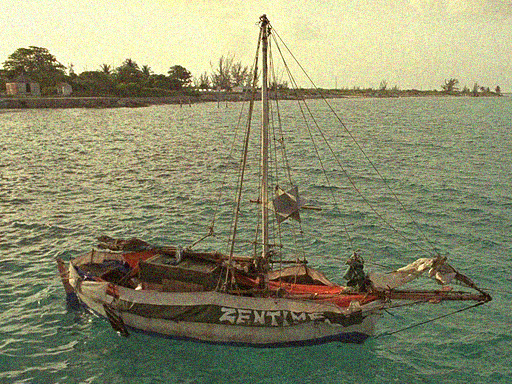

In [100]:
img_stack[3]
#41.89

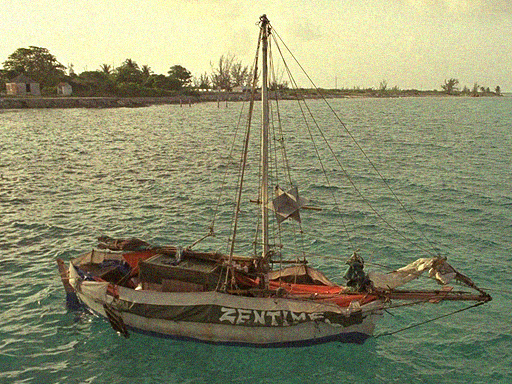

In [99]:
img_stack[2]
#32.76

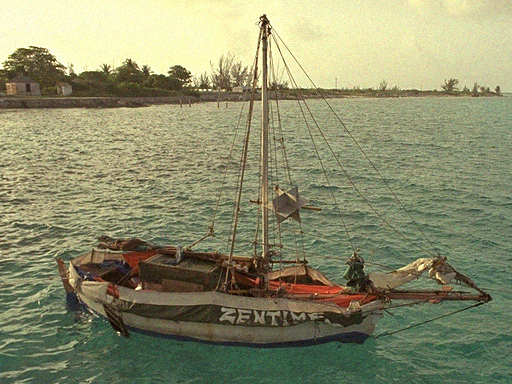

In [98]:
img_stack[1]
#23.34

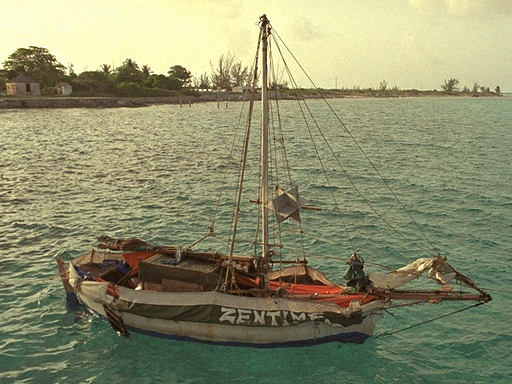

In [97]:
img_stack[0]
#16.38

In [101]:
import warnings
warnings.filterwarnings("ignore")
images=glob.glob(r'D:\tid\reference_images' + "\*.bmp")
i = 0
img_stack = []
for image in images:
    print(i, brisque.score(Image.open(image)))
    img_stack.append(Image.open(image))
    i+=1

0 17.0604451547201
1 16.360962615273905
2 9.484676452802404
3 -0.3360470762096668
4 -0.6112384115039333
5 1.4545071940897003
6 24.997222867242243
7 2.912848079302961
8 4.300069932292416
9 8.689287213071651
10 5.543197538435692
11 8.388885367562096
12 18.958043950762743
13 10.439627066768338
14 -9.453451405625998
15 -1.9092667697238141
16 -1.5097139890351912
17 12.973226180009505
18 16.147252524034656
19 6.863728675428973
20 -0.007908529667616904
21 6.53226411879038
22 -13.684829614704569
23 7.7072972028540505
24 111.06722159720832


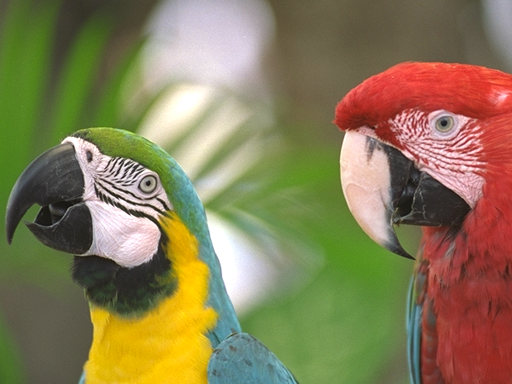

In [106]:
img_stack[22]#.save(r'D:\tid\reference_images\popugi.png')

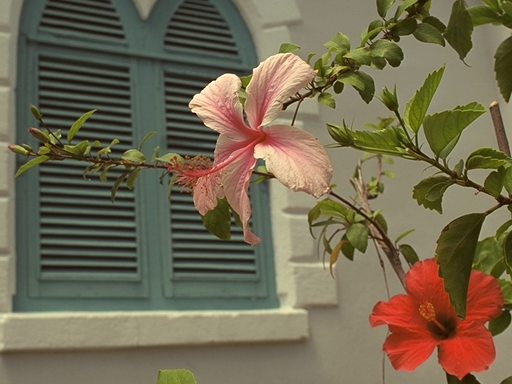

In [108]:
img_stack[6]#.save(r'D:\tid\reference_images\flow.png')

In [113]:
from PIL import ImageFilter

im_blur_popugi = img_stack[22].filter(ImageFilter.BLUR)
im_blur_popugi_gaus = img_stack[22].filter(ImageFilter.GaussianBlur)

In [120]:
im_blur_flow_gaus = img_stack[6].filter(ImageFilter.GaussianBlur)

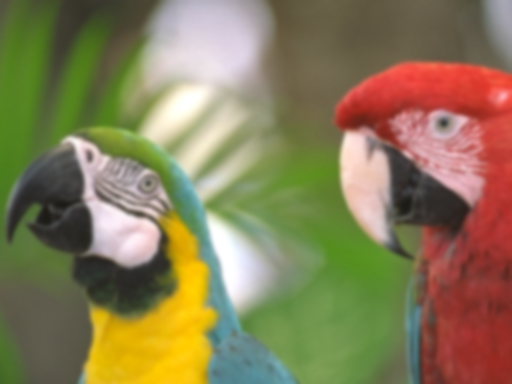

In [118]:
im_blur_popugi_gaus#.save(r'D:\tid\reference_images\popugi_gaus.png')

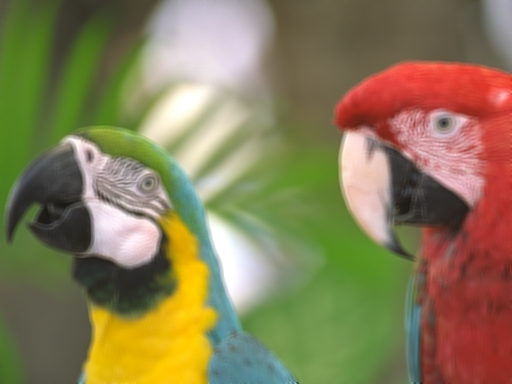

In [111]:
im_blur_popugi

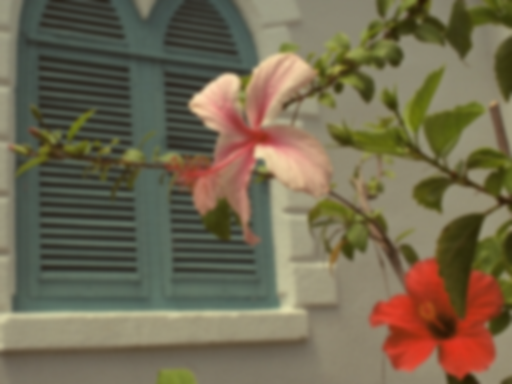

In [124]:
im_blur_flow_gaus#.save(r'D:\tid\reference_images\flow_gaus.png')

In [121]:
print(brisque.score(im_blur_flow_gaus))#, brisque.score(im_blur_popugi))

53.34066303184781


# PCA

In [125]:
path_images_20 = r'D:\cringe\20'

In [129]:
def stack_images_array(path):
    images=glob.glob(path + "\*.png")
    stack_of_imgs = []
#     i = 0
    name = []
    for image in images:
        name.append(image)
        img = Image.open(image)
        stack_of_imgs.append(img)
#         if i%98 == 0:
#             name.append(image)
#             img = Image.open(image)
#             stack_of_imgs.append(img)
#         i+=1
    return stack_of_imgs, name

In [130]:
stack_20, name_20 = stack_images_array(path_images_20)

In [261]:
len(stack_20)

4050

In [257]:
#number = float(images[0][17:-4])

In [258]:
#number

In [210]:
#a = np.arange(24,69, 0.5)

In [211]:
#b = np.arange(24,69, 0.55)

In [212]:
#c = np.arange(24,69, 0.51)

In [218]:
#array =np.concatenate((a,b,c))

In [255]:
# def stack_images_array_specific(path):
#     images=glob.glob(path + "\*.png")
#     lst = np.concatenate((a,b,c))
#     stack_of_imgs_path = []
#     for img_path in images:
#         number = float(img_path[17:-4])
#         if number in lst:
#             try:
#                 stack_of_imgs_path.append(img_path)
#             except:
#                 continue
                
#     stack_of_imgs = []
#     for image in stack_of_imgs_path:
#         img = Image.open(image)
#         stack_of_imgs.append(img)
#     return stack_of_imgs,stack_of_imgs_path

# stack_20_part, name_20_part = stack_images_array_specific(path_images_20)

In [256]:
# name_20_part

In [135]:
def yolo_information_label(model_yolo, stack_of_imgs):
    imgs_stack_yolo = []
    for im in stack_of_imgs:
        results = model_yolo(im, size=640)  
        #results.print()  # print results to screen
        #results.show()  # display results
        r = find_class(results, obj = 'car')
        if r.size == 0:
            imgs_stack_yolo.append(0)
        else:
            imgs_stack_yolo.append(1)#im.crop((r[0], r[1], r[2], r[3])))
            
    return imgs_stack_yolo

In [242]:
label_yolo_20 = yolo_information_label(model_yolo, stack_20)

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.autograd import Variable
from torchvision import models, transforms
from torch import nn
resnet152 = models.resnet152(pretrained=True)
modules=list(resnet152.children())[:-1]
resnet152=nn.Sequential(*modules)
for p in resnet152.parameters():
    p.requires_grad = False
def take_features(img):
    preprocess = transforms.Compose([
                        transforms.Resize(256),
                        transforms.CenterCrop(224),
                        transforms.ToTensor(),
                        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),])

    image = Image.fromarray(np.uint8(img)).convert('RGB')
    input_tensor = preprocess(image)
    input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

    # Run through the convolutional layers and resize the output.
    features_output = resnet152(input_batch)
    classifier_input = features_output.view(1, -1)

    return classifier_input.cpu().detach().numpy()[0]

In [243]:
features_img = []
for image in stack_20:
    features_img.append(take_features(np.array(image)))

In [244]:
import pandas as pd

In [245]:
df = pd.DataFrame(data=features_img)#, index=["row1", "row2"], columns=["column1", "column2"])

In [246]:
df

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,0.784043,0.505990,0.861758,0.464542,0.428864,0.501911,0.592533,0.437208,0.583564,0.423713,...,0.574967,0.602822,0.428262,0.352330,0.442871,0.574929,0.541223,0.407353,0.336972,0.383048
1,0.887432,0.465212,0.874183,0.487343,0.432125,0.505008,0.605041,0.449958,0.601669,0.391611,...,0.621490,0.661182,0.484799,0.333863,0.455981,0.508414,0.484411,0.412757,0.333934,0.439524
2,0.761775,0.408453,0.849472,0.395820,0.419093,0.519418,0.563707,0.413536,0.571595,0.410888,...,0.603359,0.558973,0.475259,0.338565,0.441870,0.483313,0.554310,0.399734,0.297485,0.428850
3,0.801245,0.465353,0.886473,0.451293,0.436270,0.550849,0.612752,0.407970,0.570360,0.436904,...,0.556393,0.586747,0.436507,0.361026,0.409734,0.484514,0.571427,0.433301,0.318990,0.424915
4,0.755792,0.438858,0.882556,0.466505,0.428632,0.505878,0.562022,0.461673,0.570358,0.442093,...,0.597657,0.604904,0.457948,0.353667,0.434740,0.480864,0.541948,0.358635,0.363742,0.391415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4045,0.867360,0.474643,0.875926,0.481515,0.475487,0.545966,0.559452,0.427902,0.553149,0.392371,...,0.588806,0.601029,0.430550,0.360223,0.474344,0.503579,0.540903,0.468166,0.298979,0.404155
4046,0.800123,0.463953,0.917733,0.402602,0.452916,0.549478,0.571126,0.457275,0.614419,0.456145,...,0.642134,0.700556,0.416118,0.364369,0.444772,0.584817,0.570430,0.412110,0.337292,0.400242
4047,0.818594,0.473462,0.938051,0.472574,0.463109,0.500407,0.595454,0.454266,0.571152,0.434635,...,0.592809,0.635133,0.421812,0.325930,0.431585,0.504441,0.585140,0.412025,0.352323,0.424047
4048,0.899105,0.492671,0.901724,0.437650,0.435500,0.510514,0.571984,0.428027,0.511795,0.428545,...,0.635762,0.707461,0.416241,0.345676,0.401657,0.497021,0.547597,0.382596,0.391541,0.374132


In [247]:
df_label = pd.DataFrame(data=label_yolo_20)

In [248]:
len(df_label)

4050

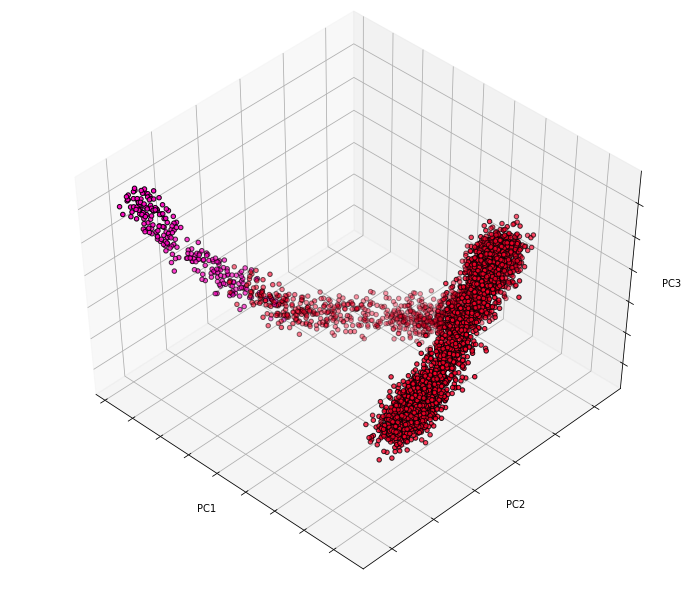

In [331]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from sklearn import decomposition
from sklearn import datasets

np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df
y = np.array(label_yolo_20)

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

# for name, label in [('not detect', 0), ('detect', 1)]:
#      ax.text3D(X[y == label, 0].mean(),
#               X[y == label, 1].mean()+0.1, 
#                0, name,
#                horizontalalignment='center',
#                bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('yolo_exTime_21000_light37_nn.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()


In [333]:
range_ex_time = np.concatenate((np.arange(1e3, 45e3, 1000), 
                                             np.arange(50e3, 500e3, 5000), 
                                             np.arange(600e3, 900e3, 50000), 
                                             np.arange(100e4, 500e4, 500000))).astype(np.int64)
        
number_of_actions = len(range_ex_time)
print(range_ex_time[80])

230000


In [320]:
stack_5, name_5 = stack_images_array(r'D:\cringe\5')
print(len(stack_5))
label_yolo_5 = yolo_information_label(model_yolo, stack_5)

4050


In [321]:
features_img_5 = []
for image in stack_5:
    features_img_5.append(take_features(np.array(image)))

In [322]:
df_5 = pd.DataFrame(data=features_img_5)

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


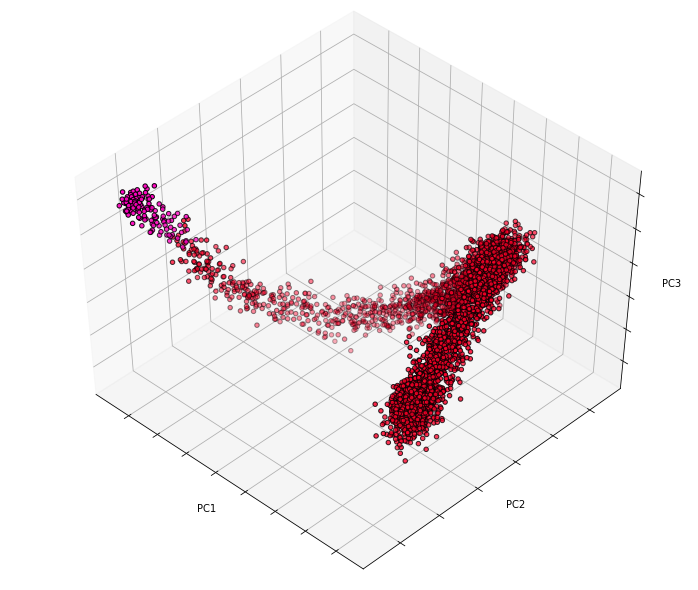

In [330]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df_5
y = label_yolo_5

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              X[y == label, 2].mean(), name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('yolo_exTime_6000_light37.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()


In [332]:
stack_80, name_80 = stack_images_array(r'D:\cringe\80')
print(len(stack_80))
label_yolo_80 = yolo_information_label(model_yolo, stack_80)
print('label')
features_img_80 = []
for image in stack_80:
    features_img_80.append(take_features(np.array(image)))
print('ok')  
df_80 = pd.DataFrame(data=features_img_80)

4050
label
ok


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


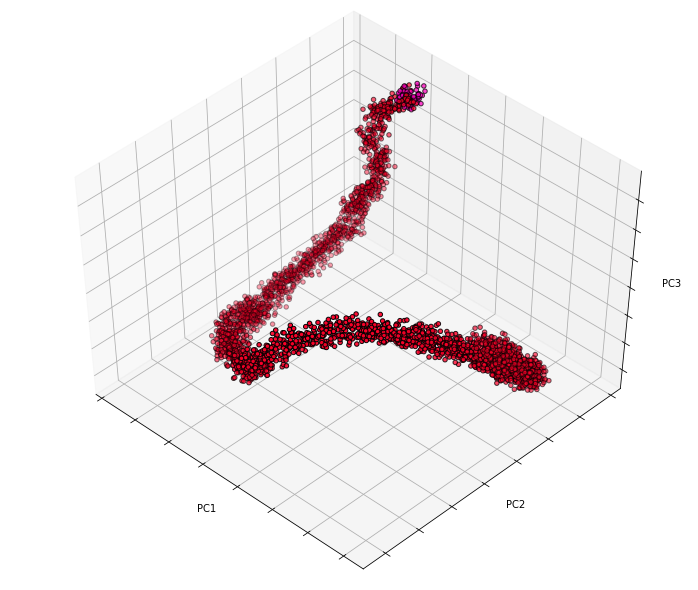

In [336]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df_80
y = label_yolo_80

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('yolo_exTime_230000_light37.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()

### retinanet

In [337]:
model = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)
model.eval()

# define the torchvision image transforms
transform = transforms.Compose([
    transforms.ToTensor(),])
#https://debuggercafe.com/object-detection-using-retinanet-with-pytorch-and-deep-learning/
def predict (image, model, detection_threshold =0.6, device ='cpu',):
    # transform the image to tensor
    image = transform(image).to(device)
    image = image.unsqueeze(0) # add a batch dimension
    with torch.no_grad():
        outputs = model(image) # get the predictions on the image
    # get all the scores
    scores = list(outputs[0]['scores'].detach().cpu().numpy())
    # index of those scores which are above a certain threshold
    thresholded_preds_inidices = [scores.index(i) for i in scores if i > detection_threshold]
    # get all the predicted bounding boxes
    bboxes = outputs[0]['boxes'].detach().cpu().numpy()
    # get boxes above the threshold score
    boxes = bboxes[np.array(scores) >= detection_threshold].astype(np.int32)
    # get all the predicited class names
    labels = outputs[0]['labels'].cpu().numpy()
    pred_classes = [coco_names[labels[i]] for i in thresholded_preds_inidices]
    return boxes, pred_classes, scores

def draw_boxes (boxes, classes, image):
    for i, box in enumerate(boxes):
        color = COLORS[coco_names.index(classes[i])]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])),
            (int(box[2]), int(box[3])),
            color, 2
        )
        cv2.putText(image, classes[i], (int(box[0]), int(box[1]-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2, 
                    lineType=cv2.LINE_AA)
    return image

In [348]:
image = Image.open(r'D:\cringe\20\img_24.0.png').convert('RGB')
# a NumPy copy for OpenCV functions
image_array = np.array(image)
# convert to OpenCV BGR color format
image_array = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

# get the bounding boxes and class labels
boxes, classes, scores = predict(image, model)
# get the final image
result = draw_boxes(boxes, classes, image_array)

In [351]:
def retina_predict(stack):
    main_res = []
    for image in stack:
        boxes, classes, scores = predict(image, model)
        if len(boxes) == 0:
            main_res.append(0)
        else:
            main_res.append(1)
    return main_res

In [352]:
main_res_20 = retina_predict(stack_20)

In [353]:
main_res_5 = retina_predict(stack_5)

In [354]:
main_res_80 = retina_predict(stack_80)

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


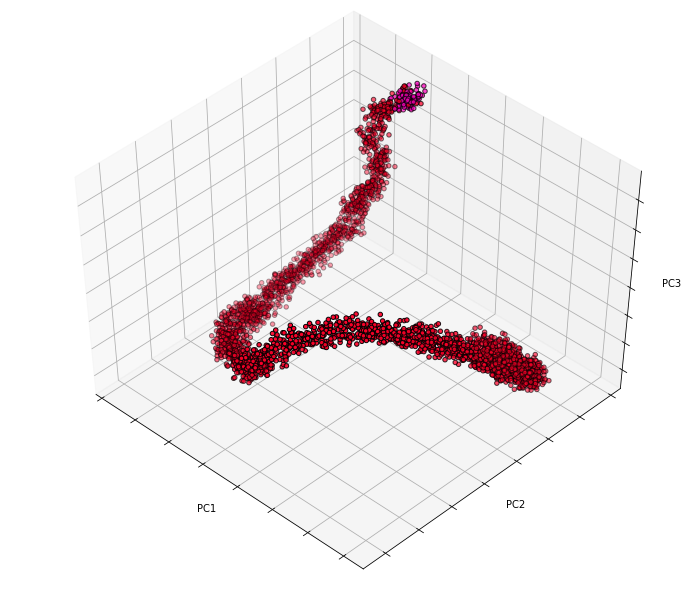

In [358]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df_80
y = main_res_80

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('retina_exTime_230000_light37.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


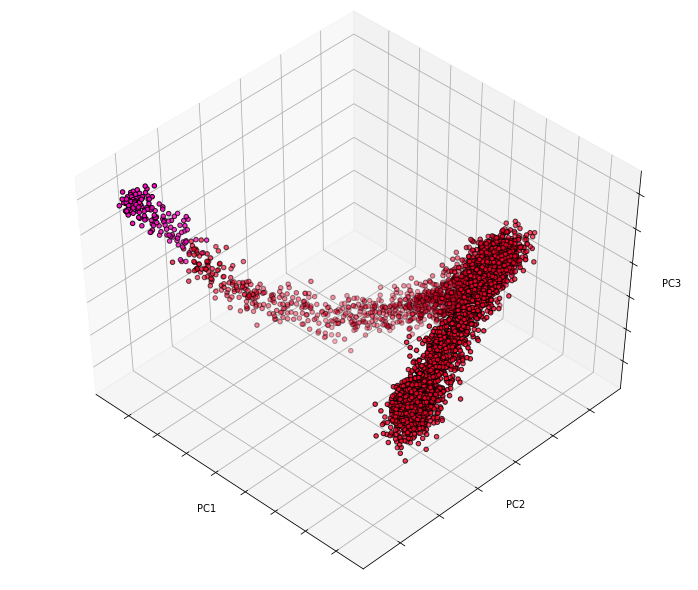

In [357]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df_5
y = main_res_5

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('retina_exTime_6000_light37.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


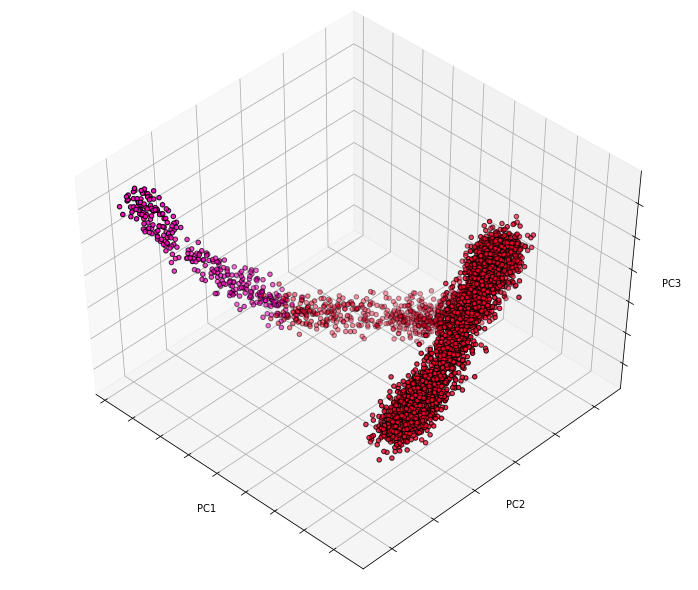

In [356]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df
y = main_res_20

fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.gist_rainbow,edgecolor='k')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
plt.savefig('retina_exTime_21000_light37.png', bbox_inches = 'tight', pad_inches = 0)
plt.show()

In [371]:
model_fast = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
# # For training
# images, boxes = torch.rand(4, 3, 600, 1200), torch.rand(4, 11, 4)
# labels = torch.randint(1, 91, (4, 11))
# images = list(image for image in images)
# targets = []
# for i in range(len(images)):
#     d = {}
#     d['boxes'] = boxes[i]
#     d['labels'] = labels[i]
#     targets.append(d)
# output = model(images, targets)
# # For inference
model_fast.eval()
# x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
# predictions = model(x)

# # optionally, if you want to export the model to ONNX:
# torch.onnx.export(model, x, "faster_rcnn.onnx", opset_version = 11)

RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256)
          )
        )
        (1): Bottleneck

In [372]:
def fcnn_predict(stack):
    model_fast = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    model_fast.eval()
    main_res = []
    for image in stack:
        boxes, classes, scores = predict(image, model_fast)
        if len(boxes) == 0:
            main_res.append(0)
        else:
            main_res.append(1)
    return main_res

In [373]:
main_res_20_fcnn = fcnn_predict(stack_20)

In [374]:
main_res_5_fcnn = fcnn_predict(stack_5)

In [375]:
main_res_80_fcnn = fcnn_predict(stack_80)

In [513]:
np.save('main_res_20_fcnn.npy',main_res_20_fcnn)
np.save('main_res_5_fcnn.npy',main_res_5_fcnn)
np.save('main_res_80_fcnn.npy',main_res_80_fcnn)

In [514]:
np.save('label_yolo_20.npy',label_yolo_20)
np.save('label_yolo_5.npy',label_yolo_5)
np.save('label_yolo_80.npy',label_yolo_80)

In [515]:
np.save('main_res_20_retina.npy',main_res_20)
np.save('main_res_5_retina.npy',main_res_5)
np.save('main_res_80_retina.npy',main_res_80)

In [516]:
df.to_csv('feature.csv')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


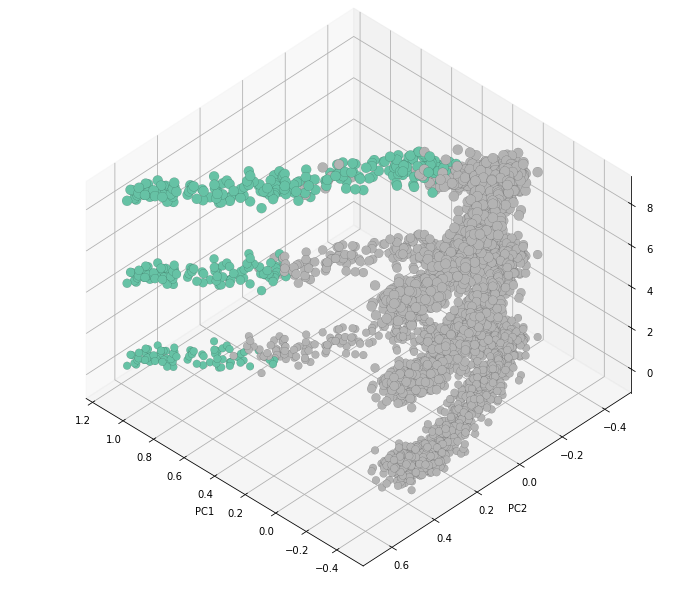

In [505]:
import random
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df
y = main_res_20
y2 = label_yolo_20
y3 = main_res_20_fcnn 


fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax.set_proj_type('ortho')

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

X = X[::3]
y = main_res_20[::3]
y2 = label_yolo_20[::3]
y3 = main_res_20_fcnn[::3]

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2]+4, 
           c=y, 
           s = 80, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y2 = np.choose(y2, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2], 
           c=y2, 
           s = 60, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y3 = np.choose(y3, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2]+8, 
           c=y3, 
           s = 100,
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
#ax.set_zlabel('PC3')


# ax.w_xaxis.set_ticklabels([])
# ax.w_yaxis.set_ticklabels([])
# ax.w_zaxis.set_ticklabels([])

plt.savefig('retina_yolo_fcnn_exTime_21000_light37.svg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


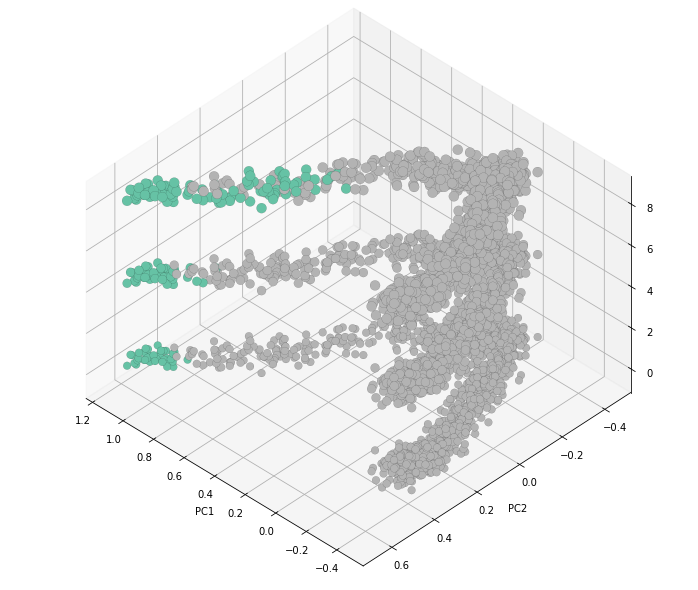

In [506]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df
y = main_res_5
y2 = label_yolo_5
y3 = main_res_5_fcnn 


fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax.set_proj_type('ortho')

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

X = X[::3]
y = main_res_5[::3]
y2 = label_yolo_5[::3]
y3 = main_res_5_fcnn[::3]

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2]+4, 
           c=y, 
           s = 80, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y2 = np.choose(y2, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2], 
           c=y2, 
           s = 60, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y3 = np.choose(y3, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2]+8, 
           c=y3, 
           s = 100,
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
#ax.set_zlabel('PC3')

# ax.w_xaxis.set_ticklabels([])
# ax.w_yaxis.set_ticklabels([])
# ax.w_zaxis.set_ticklabels([])

plt.savefig('retina_yolo_fcnn_exTime_6000_light37.svg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


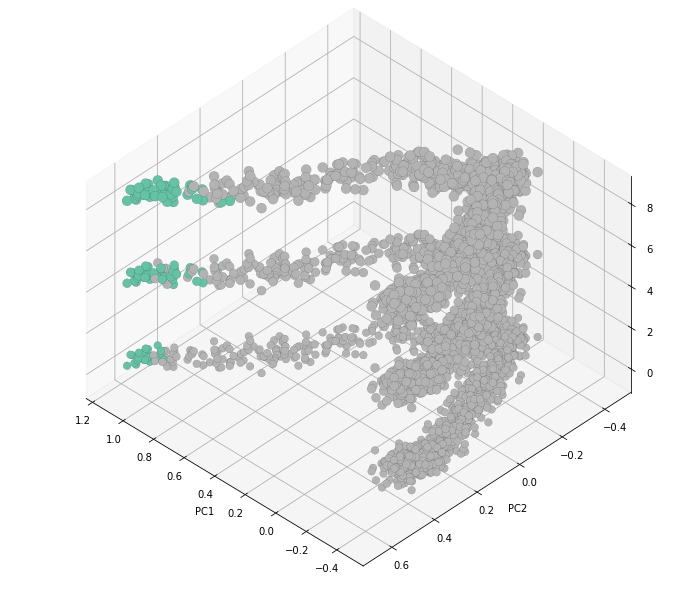

In [508]:
np.random.seed(5)

centers = [[1, 1], [-1, -1], [1, -1]]
X = df
y = main_res_80
y2 = label_yolo_80
y3 = main_res_80_fcnn 


fig = plt.figure(1, figsize=(10, 8))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

ax.set_proj_type('ortho')

plt.cla()
pca = decomposition.PCA(n_components=3)
pca.fit(X)
X = pca.transform(X)

X = X[::3]
y = main_res_80[::3]
y2 = label_yolo_80[::3]
y3 = main_res_80_fcnn[::3]

for name, label in [('not detect', 0), ('detect', 1)]:
     ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean(), 
              0, name,
               horizontalalignment='center',
               bbox=dict(alpha=0.7, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 0]).astype(float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2]+4, 
           c=y, 
           s = 80, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y2 = np.choose(y2, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2], 
           c=y2, 
           s = 60, 
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

y3 = np.choose(y3, [1, 0]).astype(float)
ax.scatter(X[:, 0] , X[:, 1], X[:, 2]+8, 
           c=y3, 
           s = 100,
           cmap=plt.cm.Set2, 
           edgecolor='k', 
           linewidths = 0.09,
          alpha = 1)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
#ax.set_zlabel('PC3')

# ax.w_xaxis.set_ticklabels([])
# ax.w_yaxis.set_ticklabels([])
# ax.w_zaxis.set_ticklabels([])



plt.savefig('retina_yolo_fcnn_exTime_230000_light37.svg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

In [512]:
range_ex_time = np.concatenate((np.arange(1e3, 45e3, 1000), 
                                     np.arange(50e3, 500e3, 5000), 
                                     np.arange(600e3, 900e3, 50000), 
                                     np.arange(100e4, 500e4, 500000))).astype(np.int64)

number_of_actions = len(range_ex_time)
print(range_ex_time[3])

4000
